-----
<div> <center> ESPACIO PARA BANNER DE LA MAESTRIA </center> </div>   

-----

# Datos Espaciales 

Este *cuaderno* trata sobre datos espaciales y estadística espacial. El objetivo del *cuaderno* es que usted aprenda a identificar, procesar, graficar y organizar datos georreferenciados usando `Python`.


**NO** es necesario editar el archivo o hacer una entrega. Sin embargo, los ejemplos contienen celdas con código ejecutable (`en gris`), que podrá modificar  libremente. Esta puede ser una buena forma de aprender nuevas funcionalidades del *cuaderno*, o experimentar variaciones en los códigos de ejemplo.

## Introducción

La estadística espacial es la rama de la estadística que se enfoca en el análisis de datos con propiedades espaciales, dentro de esto encontramos a las coordenadas geográficas o topológicas. Se parece al análisis de series de tiempo en el punto en que el objetivo es analizar datos que cambian a lo largo de alguna dimensión. En el análisis de series de tiempo, los datos cambian a través de la dimensión del tiempo; mientras que en la estadística espacial, los datos cambian a lo largo de la dimensión espacial. Hay una serie de técnicas que se incluyen en el paraguas de estadísticas espaciales, pero en este cuaderno nos enfocaremos en la técnica de estimación de densidad de kernel. Al igual que con la mayoría de los análisis estadísticos, en estadística espacial, se trata de tomar muestras de datos geográficos y utilizarlos para generar conocimientos y hacer predicciones. Por ejemplo, la estadística espacial se utiliza mucho para analizar los terremotos. Al recopilar datos de ubicación de terremotos, podemos generar mapas con áreas de alta y baja probabilidad de terremotos, y así ayudar a los especialistas a determinar dónde es probable que ocurran futuros terremotos y  a su vez, qué esperar en términos de intensidad.


## Tipos de Datos Espaciales

Los datos espaciales vienen en muchas "formas" y "tamaños", los tipos más comunes de datos espaciales son:

- Los puntos son la forma más básica de datos espaciales. Denota una ubicación de un sólo punto, como ciudades, una lectura de GPS, o cualquier otro objeto discreto definido en el espacio

- Las líneas son un conjunto de puntos ordenados, conectados por segmentos de recta

- Los polígonos denotan un área y pueden pensarse como una secuencia de puntos conectados, donde el primer punto es el mismo que el último 

- Las grillas (raster) son una colección de puntos o celdas rectangulares, organizadas en una red regular



### Shapefiles: puntos, líneas y polígonos

Los datos geoespaciales en formato vectorial a menudo se almacenan en un formato de archivo de forma. Debido a que la estructura de puntos, líneas y polígonos es diferente, cada archivo de forma individual solo puede contener un tipo de vector (todos los puntos, todas las líneas o todos los polígonos). No encontrará una mezcla de objetos de punto, línea y polígono en un solo archivo de forma.

Los objetos almacenados en un archivo de forma a menudo tienen un conjunto de atributos asociados que describen los datos. Por ejemplo, un archivo de forma de línea que contiene las ubicaciones de las corrientes, puede contener el nombre de la corriente asociada, el "orden" de la corriente y otra información sobre cada objeto de línea de corriente.

     Puede encontrar más información sobre los archivos de forma en [Wikipedia](https://en.wikipedia.org/wiki/Shapefile).

Datos espaciales en varios formatos

Uno de los formatos más utilizados son los shapefiles

Este tipo de archivos almacena geometría no topológica e información de atributos para las características espaciales en un conjunto de datos
Archivo principal: file.shp
Archivo de índice: file.shx
Tabla dBASE: file.dbf

Estos archivos deben tener el mismo nombre y deben estar en el mismo directorio (carpeta) para que puedan ser abiertos correctamente en una herramienta de GIS como R o Python.

Algunas veces un shapefile va a estar asociado con otros archivos como:
- .prj: el archivo que contiene información sobre el sistema de coordenadas y la información de proyección. Es un archivo de texto sin formato que describe la proyección utilizando el formato de texto WKT.
- .sbn y .sbx: los archivos que son un índice espacial de las características.
- .shp.xml: el archivo que son los metadatos geoespaciales en formato XML (por ejemplo, ISO 19115 o formato XML).
    
Cuando trabaje con un shapefile, debe mantener juntos todos los tipos de archivo asociados. Y cuando comparta un shapefile con un colega, ¡es importante comprimir todos estos archivos en un solo paquete antes de enviárselo!

Hoy voy a usar datos de https://datosabiertos.bogota.gov.co


#### Trabajando con Shapefiles
Vamos a utilizar la librería `geopandas` para trabajar con datos vectoriales. También usaremos matplotlib.pyplot para visualizar los datos

#### Visualizando puntos
Comenzaremos visualizando la ubicación de algunos bares de la ciudad de Bogotá, Colombia.

In [31]:
import geopandas as gpd
bares = gpd.read_file("datos/egba") # Note que solo estamos poniendo el directorio (Carpeta) donde
# se encuentran los archivos. También podría poner directamente "datos/egba/egba.shp"
bares.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 515 entries, 0 to 514
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   SUBCATEGOR  515 non-null    object  
 1   NOMBRE_EST  515 non-null    object  
 2   DIRECCION   515 non-null    object  
 3   LOC         515 non-null    object  
 4   SECTOR_CAT  515 non-null    object  
 5   LATITUD     515 non-null    float64 
 6   LONGITUD    515 non-null    float64 
 7   geometry    515 non-null    geometry
dtypes: float64(2), geometry(1), object(5)
memory usage: 32.3+ KB


In [32]:
# ¿Cuál es el Sistema de Coordenadas?
bares.crs

<Geographic 2D CRS: EPSG:4686>
Name: MAGNA-SIRGAS
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Colombia - onshore and offshore. Includes San Andres y Providencia, Malpelo Islands, Roncador Bank, Serrana Bank and Serranilla Bank.
- bounds: (-84.77, -4.23, -66.87, 15.51)
Datum: Marco Geocentrico Nacional de Referencia
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

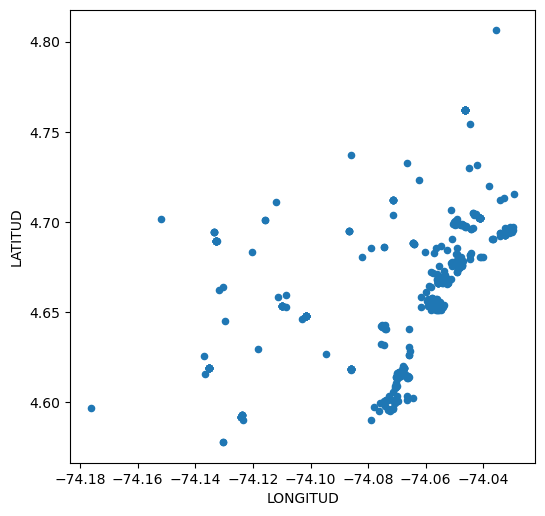

In [33]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize = (6, 6), dpi = 100)
bares.plot(kind = 'scatter', x = 'LONGITUD', y = 'LATITUD', ax = ax);

In [34]:
# Geopandas nos permite hacer una visualización interactiva de forma muy sencilla utilizando la
# función .explore().
bares.explore()

#### Visualizando líneas
Ahora vamos a visualizar las ciclovías de Bogotá

In [94]:
ciclovias = gpd.read_file("datos/Ciclovia")
ciclovias.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  14 non-null     geometry
dtypes: geometry(1)
memory usage: 240.0 bytes


In [36]:
ciclovias.crs

<Derived Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

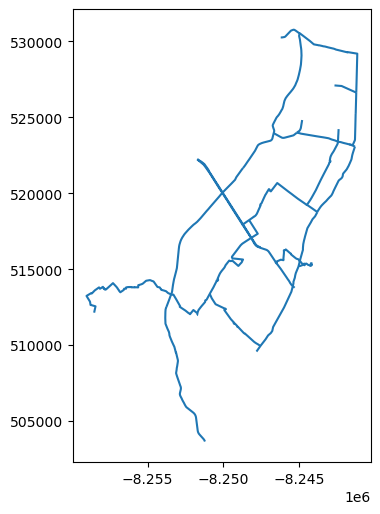

In [47]:
fig, ax = plt.subplots(figsize = (6, 6), dpi = 100)
ciclovias.plot(ax = ax);

In [48]:
ciclovias.explore()

#### Visualizando polígonos
Procedemos a visualizar las Unidades de Planeamiento Local (UPL) de Bogotá

In [63]:
upla = gpd.read_file("datos/upla")
upla.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 118 entries, 0 to 117
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   UPlCodigo   118 non-null    object  
 1   UPlTipo     118 non-null    int64   
 2   UPlNombre   118 non-null    object  
 3   UPlAAdmini  96 non-null     object  
 4   UPlArea     118 non-null    float64 
 5   SHAPE_Leng  118 non-null    float64 
 6   SHAPE_Area  118 non-null    float64 
 7   geometry    118 non-null    geometry
dtypes: float64(3), geometry(1), int64(1), object(3)
memory usage: 7.5+ KB


Queremos escoger el color de relleno de los polígonos según su área (contenida en la variable `UPlArea`). Para eso haremos uso de los argumentos `column` para escoger la columna que va a definir el color de los polígonos y `legened=True` para visualizar qué significa el color de relleno.

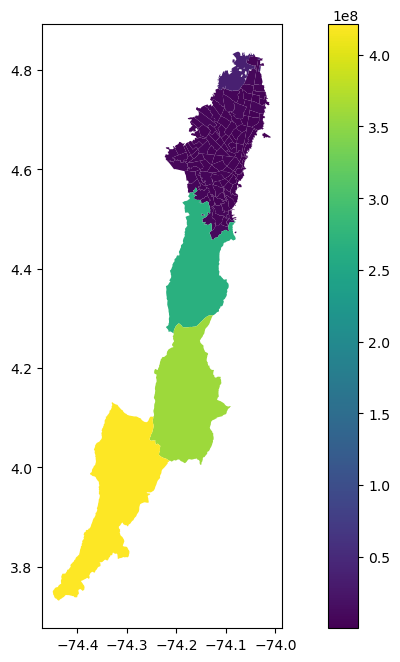

In [71]:
fig, ax = plt.subplots(figsize = (12, 8), dpi = 100)
upla.plot(ax = ax, column = "UPlArea", legend = True);

In [75]:
upla.explore(column = "UPlArea")

#### Visualizando puntos, líneas, y polígonos
Vamos a combinar los tres gráficos, sin embargo queremos remover las tres localidades del sur de Bogotá que corresponden a la zona rural de la ciudad: Río Blanco, Río Sumapaz y Río Tunjuelo.

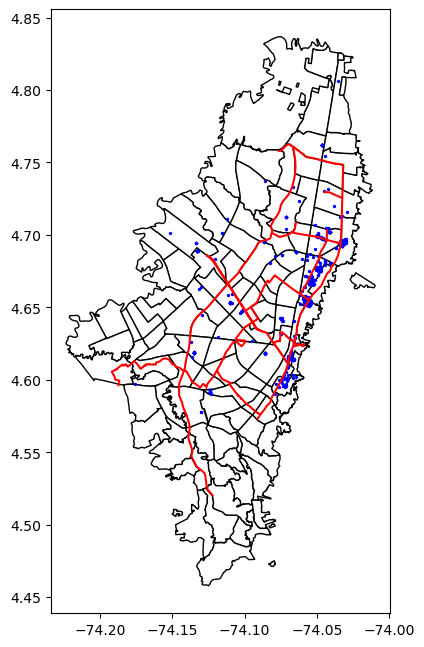

In [216]:
fig, ax = plt.subplots(figsize = (12, 8), dpi = 100)
filtro = ~upla["UPlNombre"].str.contains("RIO")
upla.loc[filtro,:].plot(ax = ax, color = 'white', edgecolor = 'black');
ciclovias.to_crs(4686).plot(ax = ax, color = "red"); # Note que la ciclovía está en un sistema de
# coordenadas diferente a upla y bares por lo que se debe transformar. 
bares.plot(ax = ax, markersize = 2, color = "blue");

In [103]:
filtro = ~upla["UPlNombre"].str.contains("RIO")
m = upla.loc[filtro,:].explore(style_kwds = dict(color = "black", fill = False, weight = 1))
ciclovias.explore(m = m, color = "red") # en este caso el sistema de coordenadas se transforma
# automáticamente
bares.explore(m = m, marker_kwds = dict(radius = 1))

## 

La Tierra no es Plana. El mundo es un elipsoide de forma irregular, pero los dispositivos de trazado son planos

Pero si queremos mostrarlo en un mapa plano, necesitamos una proyección de mapa

Esto determinará cómo transformar y distorsionar latitudes y longitudes para preservar algunas de las propiedades del mapa: área, forma, distancia, dirección o rumbo



Por ejemplo, los marineros usan la proyección de Mercator donde los meridianos y los paralelos se cruzan entre sí siempre en el mismo ángulo de 90 grados

Les permite ubicarse fácilmente en la línea que muestra la dirección en la que navegan

Pero la proyección no conserva las distancias



¿Qué proyección debo elegir?

“No existen proyecciones para todos los propósitos, todas implican distorsión cuando están lejos del el centro del marco especificado” (Bivand, Pebesma y Gómez-Rubio 2013)

Sistemas de coordenadas geográficas: sistemas de coordenadas que abarcan todo el globo terráqueo (por ejemplo, latitud/longitud)

Para los CRS geográficos, la respuesta suele ser WGS84
WGS84 es el CRS más común del mundo, código EPSG: 4326.

Sistemas de coordenadas proyectadas: sistemas de coordenadas que se focalizan en minimizar la distorsión visual en una región particular (por ejemplo, Robinson, UTM, State Plane)

En algunos casos, no somos libres de decidir: “muchas veces la elección de la proyección la hace una agencia cartográfica pública” (Bivand, Pebesma y Gómez-Rubio 2013)

Esto significa que cuando se trabaja con fuentes de datos locales, es preferible trabajar con el CRS en el que se proporcionaron los datos
Para Bogotá el IGAC promueve la adopción de MAGNA-SIRGAS. EPSG código: 4626


## Creando Objetos espaciales y midiendo distancias
<p hidden style="color:red;">Reproducir slides 21,22,23,24</p>

In [382]:
import pandas as pd
db = pd.DataFrame({
    "lugar": ["Uniandes", "Banco de la República"],
    "lat": [4.601590, 4.602151],
    "long": [-74.066391, -74.072350]
    })
db

,lugar,lat,long
0,Uniandes,4.601590,-74.066391
1,Banco de la República,4.602151,-74.072350


In [383]:
db = gpd.GeoDataFrame(db, geometry = gpd.points_from_xy(db.long, db.lat))
db

,lugar,lat,long,geometry
0,Uniandes,4.601590,-74.066391,POINT (-74.06639 4.60159)
1,Banco de la República,4.602151,-74.072350,POINT (-74.07235 4.60215)


In [384]:
# Definimos el sistema de coordenadas
db.crs = "EPSG:4326"

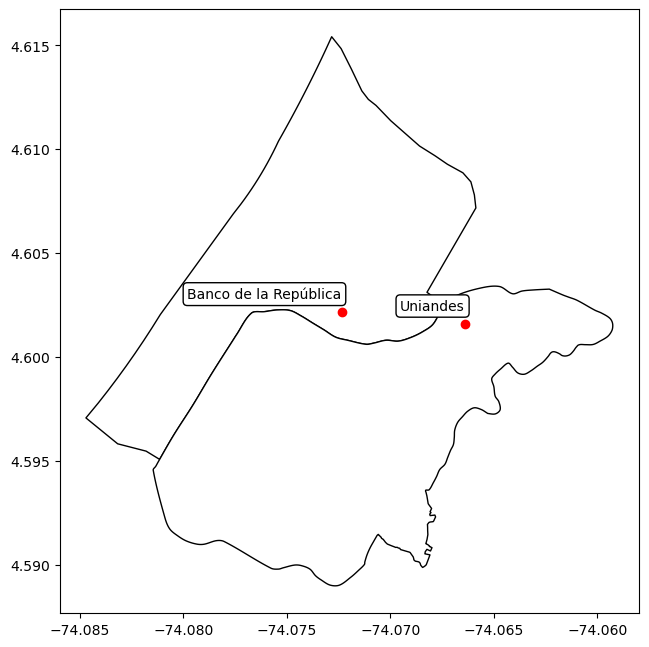

In [387]:
fig, ax = plt.subplots(figsize = (12, 8), dpi = 100)
# La Universidad de los Andes y el Banco de la República quedan en las localidades 
filtro = upla.UPlNombre.isin(["LA CANDELARIA", "LAS NIEVES"])
upla.loc[filtro,:].plot(ax = ax, color = "white", edgecolor = "black");
db.plot(ax = ax, color = "red");

# Para poder crear una marcación de los lugares necesitamos desempaquetar la geometría
db["coordenadas"] = db["geometry"].apply(lambda x: x.representative_point().coords[:][0])
for idx, fila in db.iterrows():
    plt.annotate(text = fila['lugar'], xy = fila['coordenadas'], 
        textcoords = 'offset points', xytext = (0, 10), ha = 'right',
        bbox = dict(boxstyle = "round", fc = "white"))

In [610]:
# Vamos a calcular la distancia entre Uniandes y el Banco de la República
import geopy.distance

coords_1 = db.coordenadas[0]
coords_2 = db.coordenadas[1]

# OJO! Geopandas guarda las coordenadas como (lon, lat). Sin embargo, geopy las interpreta 
# al reves (lat, lon)
geopy.distance.distance((coords_1[1], coords_1[0]), (coords_2[1], coords_1[0])).km

0.06203617861664059

**La distancia entre el Banco de la República y Uniandes es 620 metros**

Puede comprobar este resultado usted mismo desde [Google Maps](https://www.google.com/maps/dir/4.602146,+-74.07221/4.601590,+-74.066391/@4.6013775,-74.0736601,16z/data=!3m1!4b1!4m10!4m9!1m3!2m2!1d-74.07221!2d4.602146!1m3!2m2!1d-74.066391!2d4.60159!3e2)

![distancia_uniandes_banco](datos/distancia.png)

Ahora vamos a calcular la distancia de Uniandes y el BanRep a las ciclovías

In [408]:
ciclovias.crs

<Derived Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [409]:
db.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Note que el sistema de coordenadas de ambos objetos es diferente. Por ende vamos a transformar las ciclovías a la proyección EPSG:4326 para poder compararla con los puntos.

In [435]:
ciclovias = ciclovias.to_crs("EPSG:4326")
ciclovias.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Como vamos a calcular la distancia de una línea a un punto, primero vamos a calcular el punto perteneciente a la línea que está más cercano al punto. A modo de ilustración vamos a mostrar el punto más cercano de la primera ciclovía a Uniandes.

In [579]:
ciclovia = ciclovias.geometry[0]
uniandes = db.geometry[0]
punto_cercano = nearest_points(ciclovia, uniandes)[0]
punto_cercano.coords[:][0]

(-74.09933499981858, 4.681028500156322)

In [587]:
uniandes.coords[:][0]

(-74.066391, 4.60159)

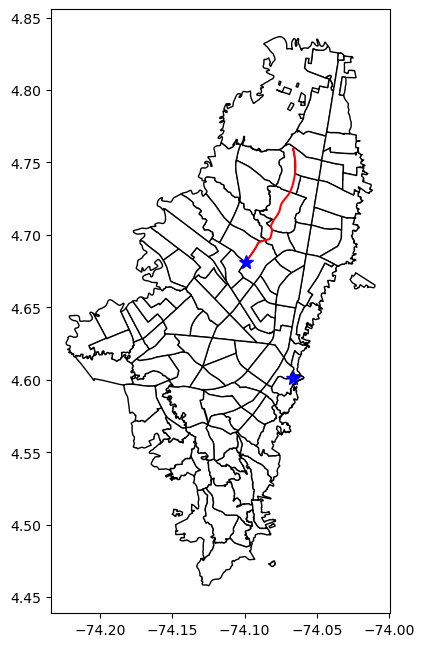

In [580]:
fig, ax = plt.subplots(figsize = (12, 8), dpi = 100)
filtro = ~upla["UPlNombre"].str.contains("RIO")
upla.loc[filtro,:].plot(ax = ax, color = 'white', edgecolor = 'black');
ciclovias.iloc[0:1,:].plot(ax = ax, color = "red"); 
plt.plot(*uniandes.coords[:][0], "*", color = "b", markersize = 10);
plt.plot(*punto_cercano.coords[:][0], "*", color = "b", markersize = 10);

In [609]:
# OJO! Geopandas guarda las coordenadas como (lon, lat). Sin embargo, geopy las interpreta 
# al reves (lat, lon)
geopy.distance.distance((punto_cercano.coords[:][0][1], punto_cercano.coords[:][0][0]),
    (uniandes.coords[:][0][1], uniandes.coords[:][0][0])).km

9.514616627186722

La distancia entre Uniandes y la ciclovía 1 es 9.5 km

In [634]:
distancias = pd.DataFrame(columns = ["Lugar", "Lugar coordenadas", "Ciclovía", 
    "Punto cercano", "Distancia"])

In [635]:
# Ahora lo haremos iterativamente para tener todas las distancias entre las ciclovias y Uniandes
# y el Banco de la República
for p in range(db.shape[0]):
    punto = db.geometry[p]
    lugar = db.lugar[p]
    for c in range(ciclovias.shape[0]):
        ciclovia = ciclovias.geometry[c]
        punto_cercano = nearest_points(ciclovia, punto)[0]
        distancia = geopy.distance.distance(
            (punto_cercano.coords[:][0][1], punto_cercano.coords[:][0][0]),
            (punto.coords[:][0][1], punto.coords[:][0][0])).km
        distancias = distancias.append({
            "Lugar": lugar, 
            "Lugar coordenadas": punto.coords[:][0],
            "Ciclovía": ciclovias.geometry[0].coords[:],
            "Punto cercano": punto_cercano.coords[:][0],
            "Distancia": distancia}, ignore_index=True)

In [637]:
distancias

,Lugar,Lugar coordenadas,Ciclovía,Punto cercano,Distancia
0,Uniandes,"(-74.066391, 4.60159)","[(-74.06572639926411, 4.760347099936292), (-74...","(-74.09933499981858, 4.681028500156322)",9.514617
1,Uniandes,"(-74.066391, 4.60159)","[(-74.06572639926411, 4.760347099936292), (-74...","(-74.07534630043656, 4.698749500142882)",10.789900
2,Uniandes,"(-74.066391, 4.60159)","[(-74.06572639926411, 4.760347099936292), (-74...","(-74.05537869921812, 4.655037399830839)",6.035283
3,Uniandes,"(-74.066391, 4.60159)","[(-74.06572639926411, 4.760347099936292), (-74...","(-74.03274159962268, 4.712836499631161)",12.855895
4,Uniandes,"(-74.066391, 4.60159)","[(-74.06572639926411, 4.760347099936292), (-74...","(-74.0553975000587, 4.654946500099967)",6.025017
5,Uniandes,"(-74.066391, 4.60159)","[(-74.06572639926411, 4.760347099936292), (-74...","(-74.13897589979534, 4.620164300432467)",8.311916
6,Uniandes,"(-74.066391, 4.60159)","[(-74.06572639926411, 4.760347099936292), (-74...","(-74.10024160026457, 4.625280600549511)",4.579450
7,Uniandes,"(-74.066391, 4.60159)","[(-74.06572639926411, 4.760347099936292), (-74...","(-74.07244938458894, 4.604421479308411)",0.741596
8,Uniandes,"(-74.066391, 4.60159)","[(-74.06572639926411, 4.760347099936292), (-74...","(-74.06887450026153, 4.610310000048883)",1.002875
9,Uniandes,"(-74.066391, 4.60159)","[(-74.06572639926411, 4.760347099936292), (-74...","(-74.09931490001411, 4.647512300501227)",6.255692


## Leaflet <p hidden style="color:red;">Cambiar por los bares de bogota</p>
En principio esta aproximación nos entrega algo de luces sobre la distribución de los puntos. Sin embargo, sin un contexto geográfico es difícil interpretar este gráfico por sí solo. Más aún, se ve que la mayoría de los inmuebles están aglomerados en el centro del gráfico, por lo cual no es claro como analizar esta información que se sobrepone en esta visualización.

Para sobreponernos a este problema podemos visualizar nuestros puntos sobre un mapa interactivo. La forma más sencilla de hacerlo es haciendo uso de la librería [`leaflet`](https://leafletjs.com/).

Sin embargo, note que nuestra base tiene más de 5 mil observaciones, por lo que visualizarla toda en el mapa interactivo puede tardar un tiempo considerable. Por lo pronto, mostraremos 100 observaciones aleatorias.

In [10]:
np.random.seed(666) # Esta semilla garantiza la replicabilidad de la gráfica
indices = np.arange(lst.shape[0]) 
np.random.shuffle(indices)
fig, ax = plt.subplots(1, figsize = (6, 6))
lst.iloc[indices[:100],:].plot(kind = 'scatter', x = 'longitude', y = 'latitude',
    s = 30, linewidth = 0, ax = ax)
mpll.display(fig = fig)

/Users/iggy/opt/anaconda3/lib/python3.7/site-packages/mplleaflet/mplexporter/exporter.py:263: MatplotlibDeprecationWarning: 
The get_offset_position function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  offset_order = offset_dict[collection.get_offset_position()]
/Users/iggy/opt/anaconda3/lib/python3.7/site-packages/IPython/core/display.py:701: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


Fíjese que el cúmulo de puntos que veíamos en la gráfica anterior corresponde al centro de Austin. 

## Alternativas para visualizar muchos más datos

`Leaflet` es el paquete que permite hacer visualizaciones de forma más rápida e intuitiva. Sin embargo, en la medida que el número de observaciones a visualizar crece, este paquete se comienza a quedar corto.

Una gran alternativa para visualizar muchos más datos es `bokeh`, un submodulo del paquete `datashaded`. (Para una introducción más completa a este paquete puede revisar este [enlace](https://anaconda.org/jbednar/nyc_taxi/notebook)).

Este paquete es un poco más técnico que `Leaflet` por lo cual requiere que se transformen los datos antes de visualizarlos. Lo primero será re proyectar nuestras latitudes/longitudes a Web Mercator. 

Antes de continuar, es importante mencionar que existen muchos tipos de "proyecciones". Estas básicamente corresponden a las transformaciones necesarias para mostrar el globo terráqueo en una superficie plana de dos dimensiones. Todas las proyecciones requieren distorsionar la superficie en la que se muestran los datos, por lo que las proporciones entre los objetos que se muestran, las distancias u otra característica del mapa puede no corresponder a una fiel copia de la realidad. Por tal motivo, es importante investigar que tipos de distorsiones o supuestos hace la proyección que vamos a emplear a la hora de visualizar nuestros datos. A pequeñas escala las variaciones entre una proyección u otra pueden ser irrelevantes. En nuestro caso estaremos usando Web Mercator la cual es muy popular entre los servicios de mapas online, de hecho es la que incorpora google maps desde 2005.

In [8]:
from shapely.geometry import Point

# Convertimos las coordenadas en puntos
puntos = lst[['longitude', 'latitude']].apply(Point, axis = 1)
# Convertimos los puntos en un objeto GeoSeries. Note que estamos definiendo explicitamente
# la proyección inicial de los puntos
xys_wb = gpd.GeoSeries(puntos, crs = "epsg:4326")
# Vamos a reproyectar a Web Mercator
xys_wb = xys_wb.to_crs(epsg = 3857)
# Separamos las coordenadas en x e y
x_wb = xys_wb.apply(lambda i: i.x)
y_wb = xys_wb.apply(lambda i: i.y)

Ahora que tenemos nuestros objetos en el formato adecuado. Vamos a crear una función para visualizar el mapa con `bokeh`

In [13]:
from bokeh.plotting import figure, output_notebook, show

output_notebook() # Se usa cuando se va a desplegar un mapa dentro de un Jupyter Notebook

# Extraemos los puntos más extremos para definir los límites del mapa
minx, miny, maxx, maxy = xys_wb.total_bounds
y_range = miny, maxy # Lo vamos a utilizar en todas las visualizaciones
x_range = minx, maxx # Lo vamos a utilizar en todas las visualizaciones

def base_plot(tools = 'pan,wheel_zoom,reset', plot_width = 600, plot_height = 400, **plot_args):
    p = figure(tools = tools, plot_width = plot_width, plot_height = plot_height,
        x_range = x_range, y_range = y_range, outline_line_color = None,
        min_border = 0, min_border_left = 0, min_border_right = 0,
        min_border_top = 0, min_border_bottom = 0, **plot_args)

    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p

# Definimos que nuestros puntos tengan color morado (#800080) y sean de tamaño 4
options = dict(line_color = None, fill_color = '#800080', size = 4)

Loading BokehJS ...

In [14]:
from bokeh.tile_providers import STAMEN_TERRAIN, get_provider

# Creamos un mapa delimitado por las coordenadas más extremas 
p = base_plot()
# Necesitamos importar un proveedor de los servicios de cartografía. Este proveedor será el
# que visualizará las calles, los ríos, parques, nombres de las ciudades, etc.
# Para ver los proveedores disponibles puede ingresar a https://docs.bokeh.org/en/latest/docs/reference/tile_providers.html#bokeh-tile-providers
# Adicionalmente, puede utilizar los servicios de Google, sin embargo deberá contar con un API: https://docs.bokeh.org/en/latest/docs/reference/plotting/gmap.html#bokeh.plotting.gmap

cartografia = get_provider(STAMEN_TERRAIN)
p.add_tile(cartografia)

# Le añadimos las ubicaciones de los inmuebles como puntos
p.circle(x = x_wb, y = y_wb, **options)

# Visualizamos nuestro mapa
show(p)

Note que `bokeh` es sustancialmente más veloz que `leaflet`. 

Cuando el mapa se presenta en la vista que permite observar todos los puntos se tiene el problema de que cuando se visualizan muchos inmuebles se forman grandes conglomerados de círculos que no permiten discernir la posición de cada quién. Parte de las ventajas de tener estos mapas interactivos es que permiten hacer zoom-in y de este modo adentrarse en las zonas de mayor densidad para que el tamaño relativo de los objetos se ajuste de tal modo que el mapa pueda ser interpretable.

Sin embargo, existen otras técnicas que permiten capturar el patrón general de la información geográfica. Tal vez la más conocida es la Estimación de Densidad Kernel (KDE por sus siglas en inglés) la cual se aproxima a la intensidad de los puntos a través de una superficie continua. Para aprender más de este método le sugerimos comenzar leyendo [esta entrada](https://pro.arcgis.com/es/pro-app/latest/tool-reference/spatial-analyst/how-kernel-density-works.htm).

Para este caso vamos a mostrar otra técnica más reciente desarrollada en la investigación titulada ["Abstract rendering: out-of-core rendering for information visualization"](https://www.semanticscholar.org/paper/Abstract-rendering%3A-out-of-core-rendering-for-Cottam-Lumsdaine/d73218d315e90f63e0c84d6a7bdf6731be079e2b) desarrollada por Cottam, Lumsdaine y Wang (2014). La implementación en Python se encuentra en el paquete [`datashader`](https://github.com/holoviz/datashader).


La ventaja clave de `datashader` es que separa el procesamiento de puntos del trazado del mapa. Por ende esta aproximación es escalable a datos realmente grandes (por ejemplo, millones de puntos). Esencialmente, el enfoque se basa en generar una cuadrícula muy fina, contar puntos dentro de píxeles y codificar el conteo en un esquema de color. En nuestro mapa, esto no es particularmente efectivo porque no tenemos demasiados puntos (el gráfico anterior es probablemente más efectivo) y esencialmente hay un píxel por ubicación de cada punto. Sin embargo, esperamos que este ejemplo muestre cómo crear este tipo de mapas escalables.

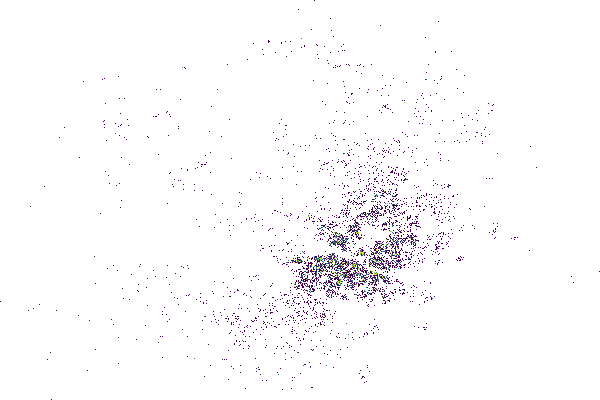

In [15]:
import datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import viridis

# Creamos un dataframe con los puntos a visualizar
puntos = pd.DataFrame({'x': x_wb, 'y': y_wb})
# Creamos la variable count en donde vamos a contar el número de inmuebles por pixel
puntos['count'] = 1

# Primero creamos el espacio donde vamos a dibujar el mapa (lienzo/canvas)
cvs = ds.Canvas(plot_width = 600, plot_height = 400, x_range = x_range, y_range = y_range)

# Agregamos los puntos
agg = cvs.points(puntos, 'x', 'y',  ds.count('count'))

# Vamos a visualizar solo grandes aglomeraciones por lo que todos los conteos por debajo del 
# percentil 90 se eliminan
umbral = np.percentile(agg, 90)
agg = agg.where(agg > umbral)

# Convertimos el DataArray en una imagen eligiendo un color de píxel RGBA para cada valor.
# Como nuestros datos son en 2D, los canales RGB se calculan a partir de una interpolación en el 
# mapa de colores dado.
img = tf.shade(agg, cmap = viridis, how = 'eq_hist')

# Para aprender sobre otro tipo de agregaciones puede visitar la documentación del paquete
# en el siguiente enlace: https://datashader.org/getting_started/Pipeline.html

img

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
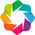

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [x,y]   (R,G,B,A)

In [27]:
import holoviews as hv
from holoviews.element.tiles import StamenToner
from holoviews.operation.datashader import datashade

# Importamos la cartografía y definimos el tamaño del mapa
hv.extension("bokeh")
cartografia = StamenToner().opts(width = 600, height = 400)

# Convertimos nuestro data frame en un objeto holoviews
puntos_hv = hv.Points(puntos, ['x', 'y'])

datos = datashade(puntos_hv, cmap=viridis, width=600, height=400)

mapa = cartografia * datos

mapa